In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import descartes
from tqdm import tqdm
import geopandas as gpd
import pickle
import requests
import os
from pyproj import Transformer
from shapely.geometry import Point, Polygon

%matplotlib inline

Loaded Pickle


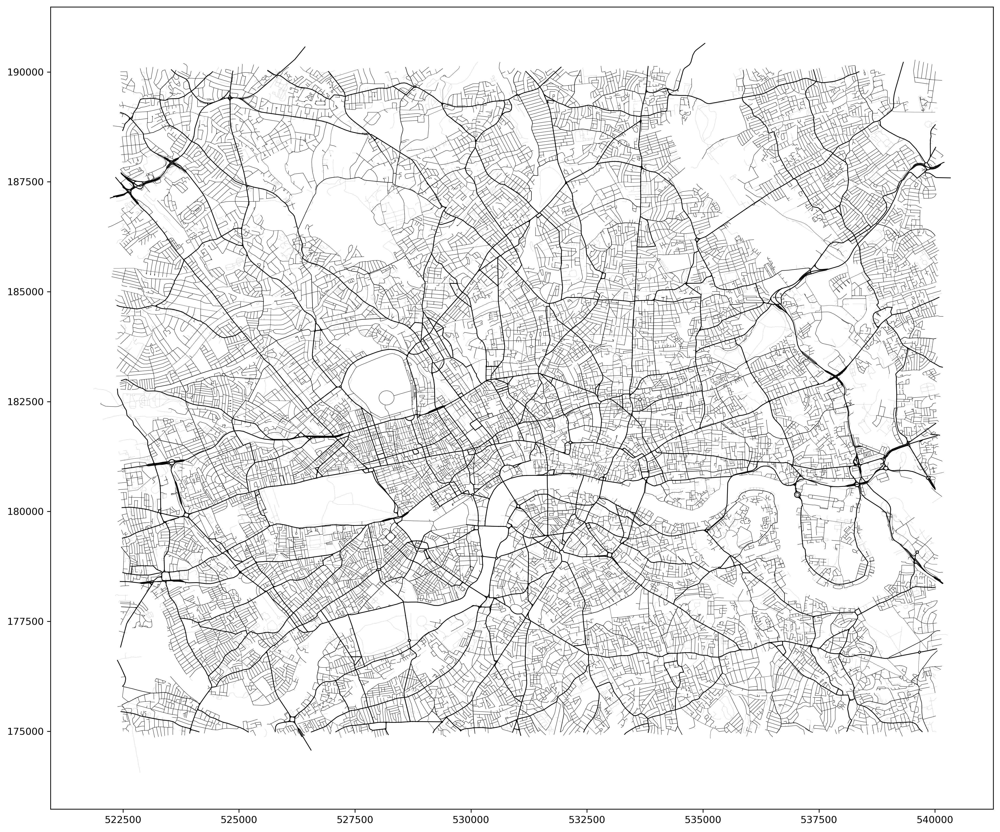

In [2]:
try:
    with open('pickle/London_road_fig.pkl', 'rb') as f:
        loaded_fig = pickle.load(f)
        ax = loaded_fig.axes[0]
        print("Loaded Pickle")
    # loaded_fig.show()
except EOFError:
    print("Error: The file is empty or corrupted.")
except Exception as e:
    print(f"An error occurred: {e}")

In [43]:

file_url = 'http://www.tfl.gov.uk/tfl/syndication/feeds/cycle-hire/livecyclehireupdates.xml'
response = requests.get(file_url)

# Check if the request was successful
if response.status_code == 200:
    # Save the CSV file
    file_path = os.path.join('data/', 'live_dock_info.xml')
    with open(file_path, 'wb') as file:
        file.write(response.content)
    print(f"Downloaded {file_url}")
else:
    print(f"Failed to download {file_url}, Status code: {response.status_code}")

Downloaded http://www.tfl.gov.uk/tfl/syndication/feeds/cycle-hire/livecyclehireupdates.xml


In [44]:
# Function to map decimal values to colors between red and green
def decimal_to_colour(value):
    norm = mcolors.Normalize(vmin=0, vmax=1)
    cmap = mcolors.LinearSegmentedColormap.from_list("", ["red", "yellow", "green"])
    return cmap(norm(value))

In [45]:
live = pd.read_xml(file_path, parser='etree')

live['fractionFull'] = live['nbBikes']/live['nbDocks']

# Define the projection transformer
transformer = Transformer.from_crs("epsg:4326", "epsg:27700", always_xy=True)

# Transform the coordinates
live['Easting'], live['Northing'] = transformer.transform(live['long'].values, live['lat'].values)
live['geometry'] = [Point(xy) for xy in zip(live['Easting'], live['Northing'])]

live['colour'] = live.apply(lambda row: decimal_to_colour(row['fractionFull']), axis=1)
live.head()




,id,name,terminalName,lat,long,installed,locked,installDate,removalDate,temporary,nbBikes,nbStandardBikes,nbEBikes,nbEmptyDocks,nbDocks,fractionFull,Easting,Northing,geometry,colour
0,1,"River Street , Clerkenwell",1023,51.529163,-0.109971,True,False,1.278947e+12,NaN,False,1,1,0,18,19,0.052632,531201.732340,182831.801961,POINT (531201.7323399857 182831.8019612367),"(1.0, 0.10196078431372549, 0.0, 1.0)"
1,2,"Phillimore Gardens, Kensington",1018,51.499607,-0.197574,True,False,1.278586e+12,NaN,False,12,12,0,24,37,0.324324,525206.415593,179391.754240,POINT (525206.4155931902 179391.7542402102),"(1.0, 0.6509803921568628, 0.0, 1.0)"
2,3,"Christopher Street, Liverpool Street",1012,51.521284,-0.084606,True,False,1.278240e+12,NaN,False,3,3,0,28,32,0.093750,532984.001881,182001.341198,POINT (532984.0018806285 182001.3411977346),"(1.0, 0.18823529411764706, 0.0, 1.0)"
3,4,"St. Chad's Street, King's Cross",1013,51.530059,-0.120974,True,False,1.278241e+12,NaN,False,17,17,0,5,23,0.739130,530435.982367,182911.772902,POINT (530435.9823671918 182911.7729016338),"(0.5176470588235293, 0.7597693194925028, 0.0, ..."
4,5,"Sedding Street, Sloane Square",3420,51.493130,-0.156876,True,False,1.278241e+12,NaN,False,11,11,0,12,27,0.407407,528049.277060,178741.842635,POINT (528049.2770600404 178741.8426345289),"(1.0, 0.8156862745098039, 0.0, 1.0)"


Loaded Pickle


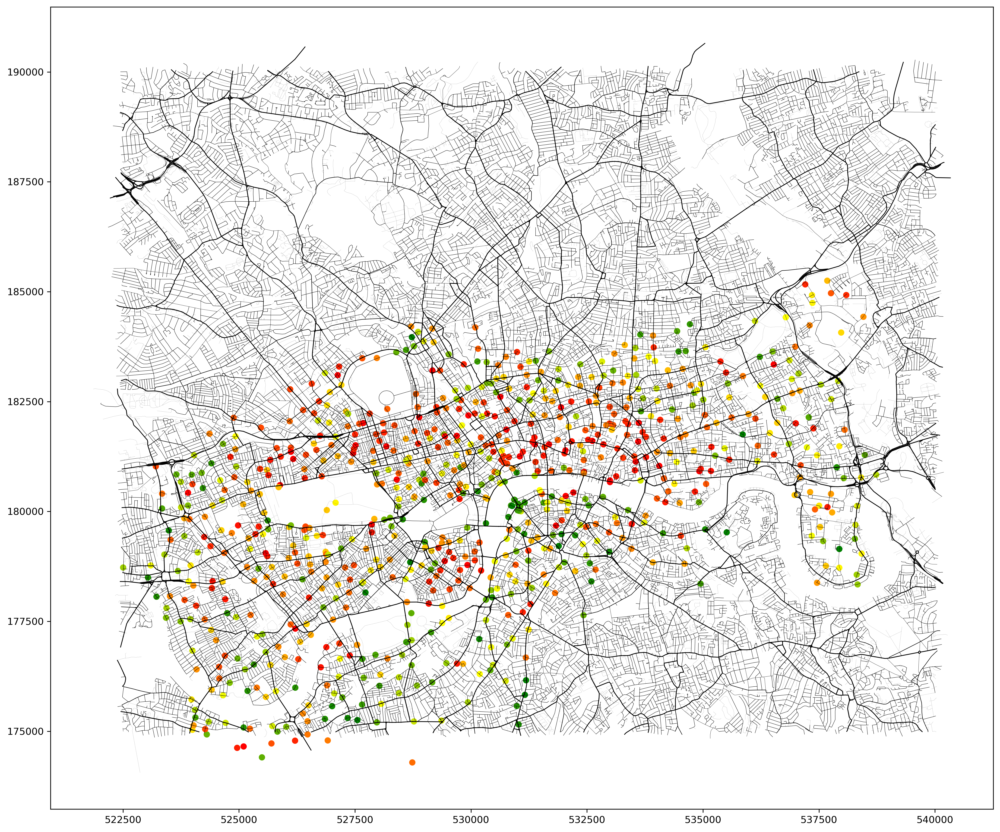

In [46]:
try:
    with open('pickle/London_road_fig.pkl', 'rb') as f:
        loaded_fig = pickle.load(f)
        ax = loaded_fig.axes[0]
        print("Loaded Pickle")
    # loaded_fig.show()
except EOFError:
    print("Error: The file is empty or corrupted.")
except Exception as e:
    print(f"An error occurred: {e}")

for idx, row in live.iterrows():
    
    ax.scatter(row['Easting'], row['Northing'], color=row['colour'], lw=0.5)

plt.show()